In [56]:
import scanpy as sc

sc_data = sc.read_h5ad('/mnt/c/Users/ouyangkang/Desktop/convert_sc_data.h5ad')

/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/numba/core/types/__init__.py:108: FutureWarning: In the future `np.long` will be defined as the corresponding NumPy scalar.
  long_ = _make_signed(np.long)


AttributeError: module 'numpy' has no attribute 'long'

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 10.0.0
asttokens           NA
backcall            0.2.0
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
executing           1.2.0
h5py                3.9.0
igraph              0.10.6
importlib_resources NA
ipykernel           6.24.0
jedi                0.18.2
joblib              1.3.0
kiwisolver          1.4.4
leidenalg           0.10.0
llvmlite            0.40.1
louvain             0.8.0
matplotlib          3.7.1
mpl_toolkits        NA
natsort             8.4.0
numba               0.57.1
numpy               1.24.4
packaging           23.1
pandas              2.0.3
parso               0.8.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      3.0.39
psutil              5.9.5
ptyprocess          0.7.0
pure_eval           0.2.2
pydev_ipython       NA

In [2]:
# find highly differential gene

sc.pp.neighbors(sc_data, n_neighbors=10)

# sc.tl.leiden(sc_data)
# sc.tl.rank_genes_groups(sc_data, 'leiden', method='t-test')
# sc.pl.rank_genes_groups(sc_data, n_genes=25, sharey=False)

/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/ouyangkang/software/anaconda3/envs/scRNA/l

In [3]:
sc_data

AnnData object with n_obs × n_vars = 238242 × 16725
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'cell', 'pANN', 'library', 'RNA_snn_res.0.5', 'seurat_clusters', 'collected_time', 'infer_age', 'infer_age_int', 'tissue_old', 'sub_cluster_number', 'celltype', 'tissue_update', 'germ_layer', 'subtype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_scvi', 'X_umap'
    obsp: 'distances', 'connectivities'

In [35]:
# sc.tl.leiden(sc_data)

running Leiden clustering
    finished: found 53 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:58)


In [3]:
sc.tl.rank_genes_groups(sc_data, 'celltype', method='t-test')

/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/tools/_

In [4]:
sc_data.write_h5ad("/home/ouyangkang/scRNA_data/processing_data.h5ad",compression='gzip')

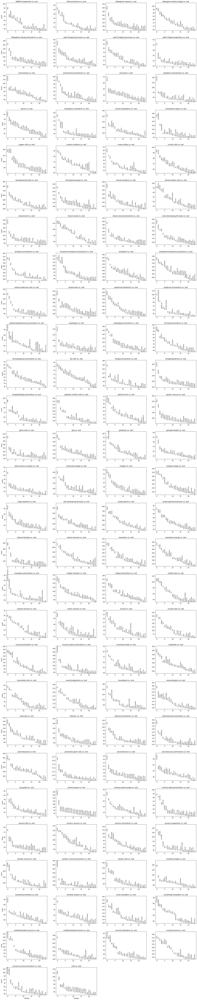

In [5]:
sc.pl.rank_genes_groups(sc_data, n_genes=25, sharey=False)

In [6]:
import pandas as pd

def rank_genes_groups_df(adata, key='rank_genes_groups',subgroup = None):
        dd = []
        groupby = adata.uns[key]['params']['groupby']
        if subgroup != None:
            cate = subgroup
        else:
            cate = adata.obs[groupby].cat.categories
        #print(cate)
        for group in cate:
            cols = []
            # inner loop to make data frame by concatenating the columns per group
            for col in adata.uns[key].keys():
                if col != 'params':
                       cols.append(pd.DataFrame(adata.uns[key][col][str(group)], columns=[col]))
            df = pd.concat(cols,axis=1)
            df['group'] = group
            dd.append(df)
        # concatenate the individual group data frames into one long data frame
        rgg = pd.concat(dd)
        rgg['group'] = rgg['group'].astype('category')
        return rgg

def get_top(df,num):
    top = []
    for i in df['group'].unique().tolist():
        ddf = df[df['group']==i].head(int(num))
        top.append(ddf)
    gene_df = pd.concat(top)
    return gene_df

In [7]:
genes = list(set(get_top(rank_genes_groups_df(sc_data), 200).names.tolist())) # all gene

In [8]:
len(genes)

4554

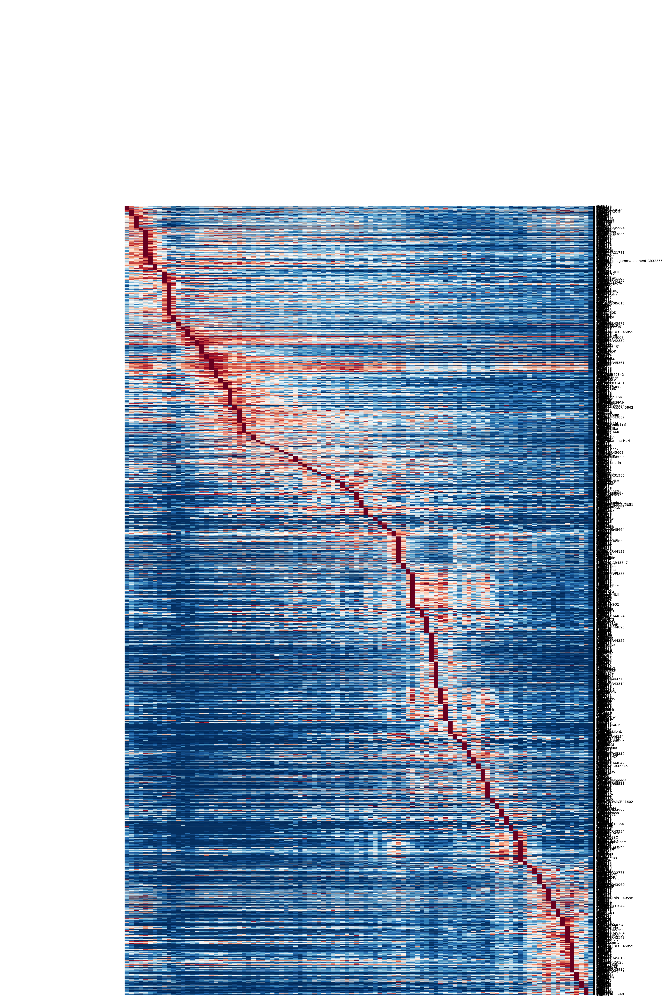

In [9]:
# get matrix 
import dynamo as dyn

dyn.pl.kinetic_heatmap(
    sc_data,
    genes = genes,
    basis ='umap',
    mode = 'pseudotime',
    tkey = 'infer_age',
    gene_order_method = 'maximum',
    color_map  = 'RdBu_r',
    show_colorbar =False,
    #dist_threshold  = 3e-10,
    #spaced_num =200,
    figsize =(20,30),
    #enforce =True
)

In [ ]:
cluster_data = sc_data.uns['kinetics_heatmap']
cluster_data

In [12]:
cluster_data.reset_index(inplace=True)
cluster_data.drop_duplicates(subset=['index'], inplace=True)
cluster_data.drop('level_0', axis=1, inplace=True)
cluster_data.set_index(pd.Series(cluster_data['index'].tolist()), inplace=True)
cluster_data.drop('index', axis=1, inplace=True)
cluster_data

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
CG10576,1.000000,0.832261,0.522832,0.547182,0.308253,0.257614,0.182606,0.244779,0.446787,0.240783,...,0.573927,0.494927,0.379408,0.719428,0.621717,0.571185,0.336481,0.214425,0.552085,0.268883
CG8850,1.000000,0.753640,0.195594,0.209502,0.127846,0.263492,0.392808,0.254666,0.256303,0.125711,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Myo81F,1.000000,0.162076,0.382869,0.542333,0.319391,0.277681,0.310916,0.173631,0.000000,0.021161,...,0.361253,0.356427,0.290757,0.162755,0.261033,0.301922,0.176816,0.580714,0.686522,0.067514
Dlish,1.000000,0.902269,0.123907,0.496717,0.397351,0.127635,0.158672,0.005498,0.000000,0.000000,...,0.052992,0.193696,0.000000,0.151783,0.000000,0.122137,0.000000,0.000000,0.000000,0.000000
chrb,1.000000,0.757289,0.509649,0.591626,0.530046,0.446353,0.297233,0.300778,0.493012,0.397940,...,0.412293,0.330546,0.289090,0.494880,0.570786,0.399525,0.346580,0.301501,0.477559,0.031870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hpRNA:CR33940,0.228960,0.012349,0.006863,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.049561,...,0.793067,0.321151,0.792790,0.375949,0.475696,0.505529,0.994698,0.886150,1.000000,0.196744
CG2091,0.080935,0.007871,0.000000,0.000000,0.005599,0.006975,0.007660,0.000000,0.000000,0.010048,...,0.734187,0.248243,0.871391,0.146891,0.201548,0.249502,0.907780,0.632106,1.000000,0.311504
vn,0.066620,0.192866,0.055800,0.056374,0.184202,0.110254,0.041157,0.175622,0.309393,0.456561,...,0.937370,0.221419,0.647096,0.508070,0.514481,0.730361,0.850988,0.471451,1.000000,0.167744
Bet1,0.124392,0.022873,0.000000,0.000000,0.029355,0.014823,0.000000,0.005533,0.000000,0.000000,...,0.698830,0.343629,0.899837,0.338940,0.308693,0.636341,0.920563,0.465541,1.000000,0.211400


In [13]:
cluster_data.to_csv('/home/ouyangkang/Learning/daily_work/data/cluster_data.csv')

In [14]:
gene_name = cluster_data.index.tolist()

In [235]:
gene_celltype = rank_genes_groups_df(sc_data)
gene_celltype = gene_celltype[gene_celltype['names'].isin(gene_name)]
gene_celltype.drop_duplicates(subset=['names', 'group'], inplace=True)
gene_celltype

,names,scores,pvals,pvals_adj,logfoldchanges,group
0,Df31,86.969223,1.532433e-242,2.791933e-241,2.674303,AMP/EE progenitors
1,HmgD,67.639854,1.788265e-201,2.684806e-200,2.903559,AMP/EE progenitors
2,alphaTub84B,66.690048,1.213076e-201,1.824523e-200,1.876209,AMP/EE progenitors
3,Ance,65.163940,2.108748e-193,3.077557e-192,5.988775,AMP/EE progenitors
4,His2Av,64.916946,2.323992e-196,3.433637e-195,2.391181,AMP/EE progenitors
...,...,...,...,...,...,...
16628,x16,-57.014446,1.047137e-277,6.254772e-276,-3.888296,yolk
16635,Pep,-57.795959,6.357523e-277,3.704863e-275,-3.507752,yolk
16640,14-3-3epsilon,-58.217716,1.020893e-276,5.928626e-275,-3.509039,yolk
16641,geminin,-58.801800,1.807591e-289,1.219031e-287,-4.159247,yolk


In [21]:
import pandas as pd
cluster_data = pd.read_csv('/home/ouyangkang/Learning/daily_work/data/cluster_data.csv', index_col=0)

In [22]:
cluster_data

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
CG10576,1.000000,0.832261,0.522832,0.547182,0.308253,0.257614,0.182606,0.244779,0.446787,0.240783,...,0.573927,0.494927,0.379408,0.719428,0.621717,0.571185,0.336481,0.214425,0.552085,0.268883
CG8850,1.000000,0.753640,0.195594,0.209502,0.127846,0.263492,0.392808,0.254666,0.256303,0.125711,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Myo81F,1.000000,0.162076,0.382869,0.542333,0.319391,0.277681,0.310916,0.173631,0.000000,0.021161,...,0.361253,0.356427,0.290757,0.162755,0.261033,0.301922,0.176816,0.580714,0.686522,0.067514
Dlish,1.000000,0.902269,0.123907,0.496717,0.397351,0.127635,0.158672,0.005498,0.000000,0.000000,...,0.052992,0.193696,0.000000,0.151783,0.000000,0.122137,0.000000,0.000000,0.000000,0.000000
chrb,1.000000,0.757289,0.509649,0.591626,0.530046,0.446353,0.297233,0.300778,0.493012,0.397940,...,0.412293,0.330546,0.289090,0.494880,0.570786,0.399525,0.346580,0.301501,0.477559,0.031870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hpRNA:CR33940,0.228960,0.012349,0.006863,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.049561,...,0.793067,0.321151,0.792790,0.375949,0.475696,0.505529,0.994698,0.886150,1.000000,0.196744
CG2091,0.080935,0.007871,0.000000,0.000000,0.005599,0.006975,0.007660,0.000000,0.000000,0.010048,...,0.734187,0.248243,0.871391,0.146891,0.201548,0.249502,0.907780,0.632106,1.000000,0.311504
vn,0.066620,0.192866,0.055800,0.056374,0.184202,0.110254,0.041157,0.175622,0.309393,0.456561,...,0.937370,0.221419,0.647096,0.508070,0.514481,0.730361,0.850988,0.471451,1.000000,0.167744
Bet1,0.124392,0.022873,0.000000,0.000000,0.029355,0.014823,0.000000,0.005533,0.000000,0.000000,...,0.698830,0.343629,0.899837,0.338940,0.308693,0.636341,0.920563,0.465541,1.000000,0.211400


In [3]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

cmap = sns.color_palette( "ch:start=.2,rot=-.3", n_colors=1_000)
sns.set_context( context='paper')
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'lightgrey'})

/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


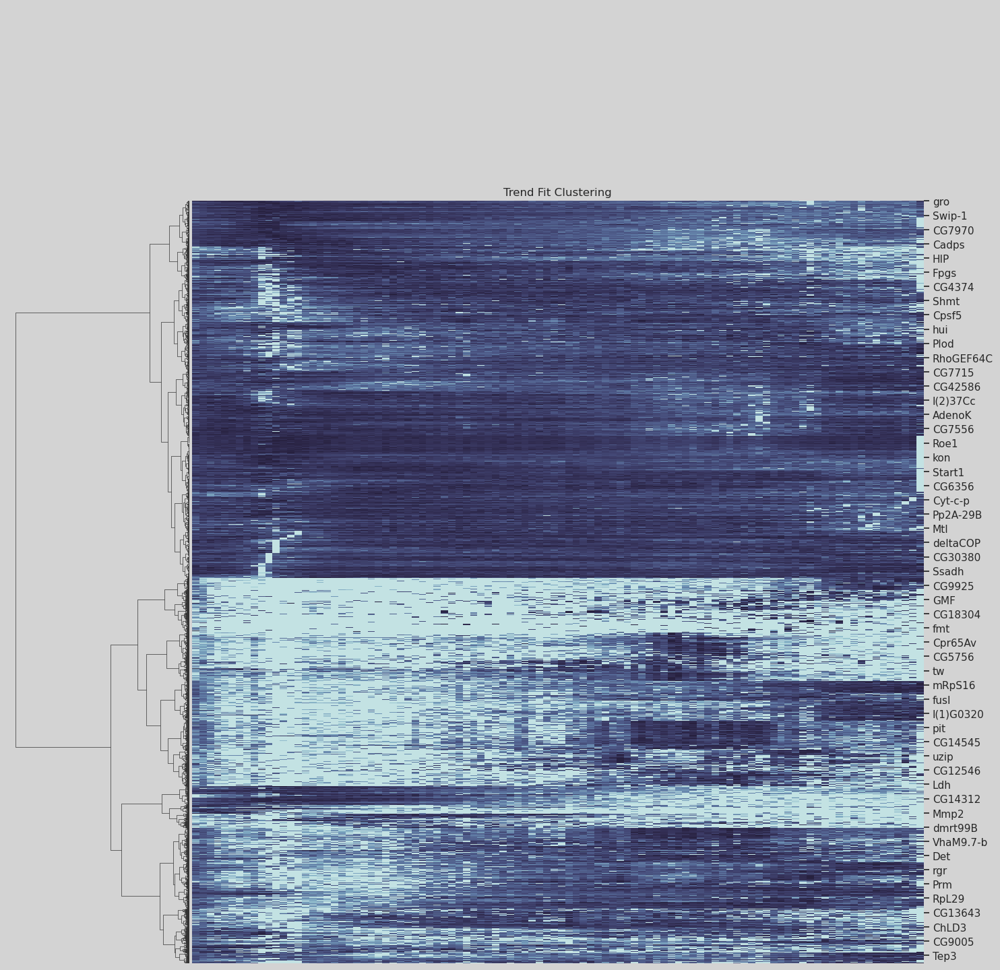

In [4]:
# using seaborn clustermap, which uses scipy hierarchical clustering
# this will take a while to run
ax = sns.clustermap( cluster_data, metric='euclidean', method='ward', col_cluster=False, row_cluster=True, cmap=cmap, figsize=(15,15), standard_scale=0)
ax.cax.set_visible(False)
num_stages = 6
ticks = np.linspace(0, cluster_data.shape[1], num_stages)
ax.ax_heatmap.set_xticks( ticks);
# ax.ax_heatmap.set_xticklabels( adata.uns['stage_order'], rotation=90);
ax.ax_row_dendrogram.set_visible(True)
plt.setp( ax.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
ax.ax_heatmap.set_title( "Trend Fit Clustering");

In [5]:
import matplotlib.cm as cm
import matplotlib as mp

# set colors used in manuscript
tttt = cm.get_cmap('tab20', 20)
tab20 = []
for i in range(tttt.N):
    rgba = tttt(i)
    tab20.append( mp.colors.rgb2hex(rgba))

/tmp/ipykernel_5500/2254192197.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  tttt = cm.get_cmap('tab20', 20)


In [6]:
from scipy.cluster import hierarchy

dend_link = ax.dendrogram_row.linkage
cut_tree = hierarchy.cut_tree(dend_link, height=30).squeeze()
u_clust = np.unique(cut_tree)
cut_tree

array([0, 1, 0, ..., 2, 2, 9])

In [7]:
devDEGs_df = pd.DataFrame()
devDEGs_df['gene_name'] = [i for i in cluster_data.index]
devDEGs_df['gene_trend'] = cut_tree
devDEGs_df.head()

,gene_name,gene_trend
0,CG10576,0
1,CG8850,1
2,Myo81F,0
3,Dlish,2
4,chrb,0


In [8]:
row_order = (hierarchy.leaves_list(dend_link))
_, idx = np.unique(cut_tree[row_order], return_index=True)
cluster_order = cut_tree[row_order][np.sort(idx)]
cluster_order

array([3, 4, 0, 6, 7, 9, 8, 1, 5, 2])

In [9]:
# format cluster colors for plotting
lut = dict( zip( cluster_order, tab20))
row_colors = pd.Series( cut_tree).map( lut)

In [16]:

ax = sns.clustermap( cluster_data.reset_index(drop=True), row_linkage=dend_link, row_colors=row_colors, col_cluster=False, 
                     row_cluster=True, cmap=cmap, figsize=(30,30), standard_scale=0, 
                     yticklabels=[], cbar_pos=None, dendrogram_ratio=(0.10,0.01))
num_stages = 6
ticks = np.linspace(0, 100, num_stages)
ax.ax_heatmap.set_xticks( ticks);
# ax.ax_heatmap.set_xticklabels( adata.uns['stage_order'], rotation=90);
ax.ax_row_dendrogram.set_visible(True)
plt.setp( ax.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
ax.ax_heatmap.set_title( "Clustered Trend Fits")

Text(0.5, 1.0, 'Clustered Trend Fits')

In [17]:
# trend cluster
down = ['1', '6', '7']
inter_down = ['5', '9']
inter_up = ['0', '2', '4', '8']
up = ['3']

In [18]:
from sklearn import preprocessing
# genes can be list/array of ints or gene names 
def plot_tend_avg( genes, trend_df, scat_df=None, color='green', alpha=1.0):
    min_max_scaler = preprocessing.MinMaxScaler()
    plt.figure( figsize=(4.625*3,4.625)) #, facecolor='white')
    # plot trend fit
    trends = trend_df.loc[genes,:]
    norm_td = min_max_scaler.fit_transform( trends.T)
    avg_td = np.mean( norm_td, axis=1)
    plt.plot( norm_td, linewidth=1.0, alpha=0.01, color=color)
    plt.plot( avg_td, linewidth=2.5, alpha=alpha, color='black')

    num_stages = 20 # len( adata.uns['stage_order'])
    ticks = np.linspace(0, 100, num_stages)
    plt.xticks( ticks, [""]*len(ticks))
    return

In [19]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.style.use('seaborn-whitegrid')
n_grid_pts = 100
# plt.rcParams['axes.facecolor'] = 'white'
for clust_itr in cluster_order:
    clust_mk = cut_tree==clust_itr
    print( clust_itr, sum(clust_mk))
    clust_genes = cluster_data.index[clust_mk]
    plot_tend_avg( clust_genes, cluster_data, alpha=0.9, color=lut[clust_itr])
    plt.title( clust_itr)
    plt.ylim(0.0,1.0)
    plt.xlim(0,n_grid_pts-1)
    # plt.savefig( f"../path/out/trend-clust_height-90_{clust_itr}_trend-plots.png", format='png', bbox_inches='tight')num_stages = len( np.unique( logTMMs['L4_RORB'].columns))
ticks = np.linspace(0, n_grid_pts-1, num_stages)
plt.xticks( ticks=ticks,labels=[1,2,3,4,5,6], rotation=90)
# have to the last one to get x-labels
# plt.savefig( f"../path/out/trend-clust_height-90_{clust_itr}_trend-plots.png", format='png', bbox_inches='tight')

/tmp/ipykernel_5500/2152104410.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  mpl.style.use('seaborn-whitegrid')


3 469
4 543
0 1241
6 324
7 290
9 238
8 391
1 249
5 484
2 325


([<matplotlib.axis.XTick at 0x7fe645052c40>,
 [Text(0.0, 0, '1'),
  Text(19.8, 0, '2'),
  Text(39.6, 0, '3'),
  Text(59.400000000000006, 0, '4'),
  Text(79.2, 0, '5'),
  Text(99.0, 0, '6')])

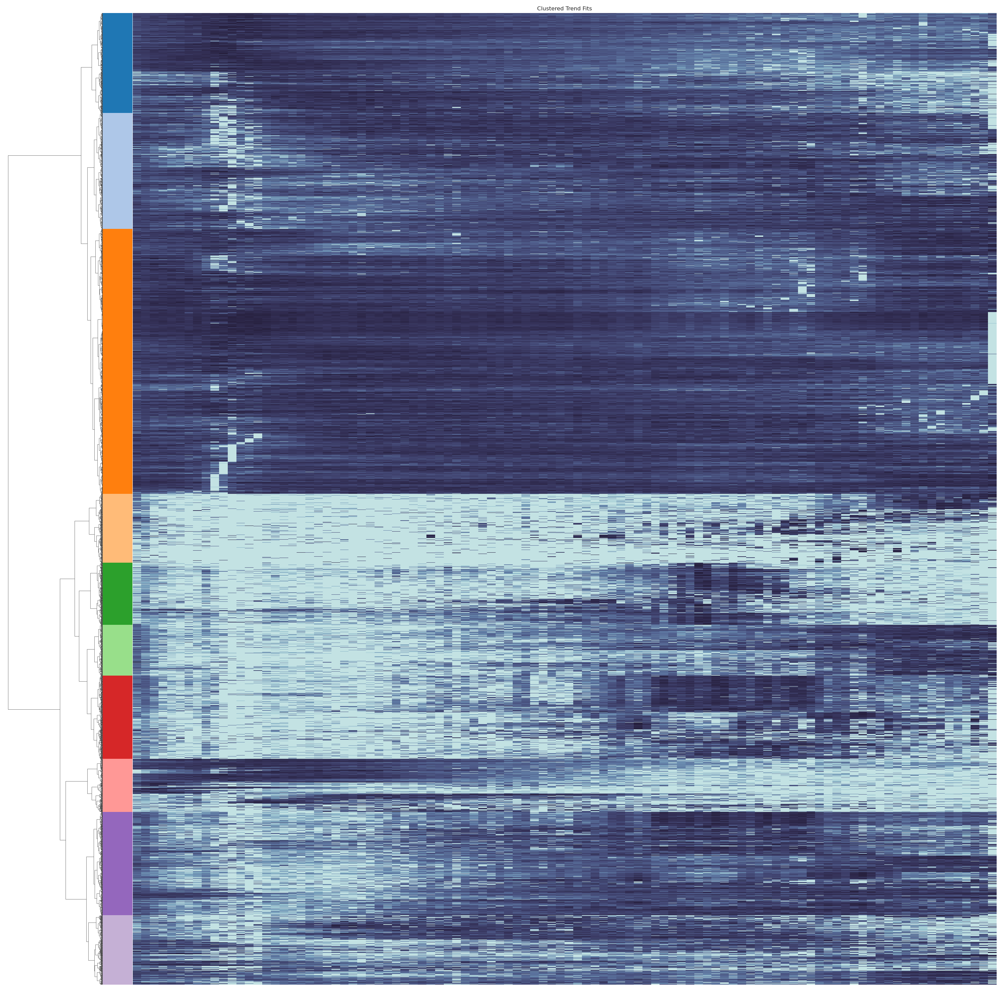

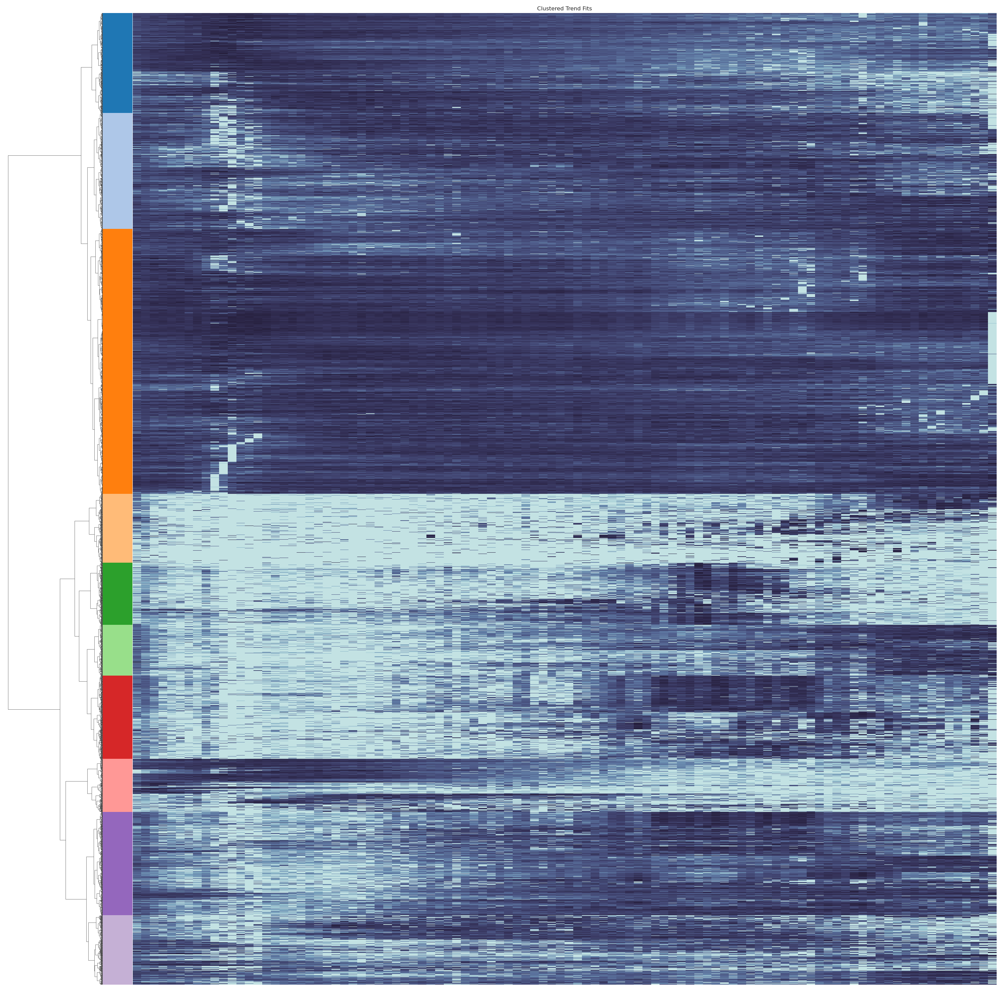

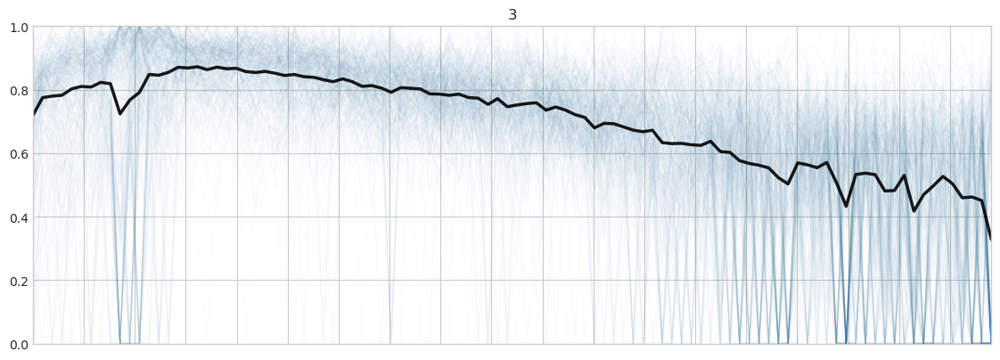

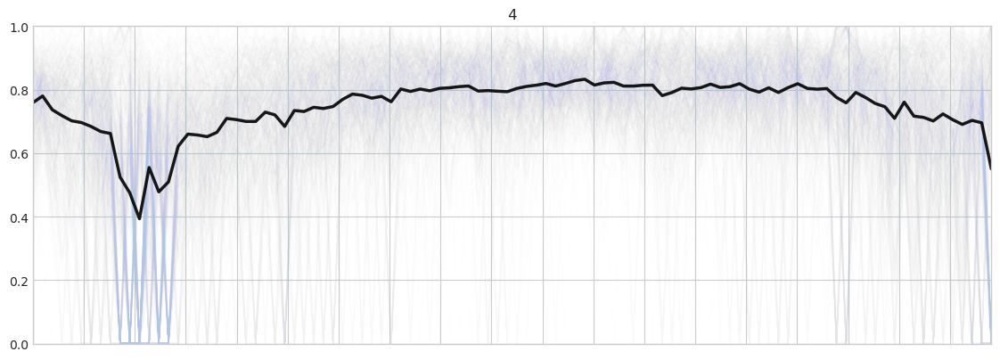

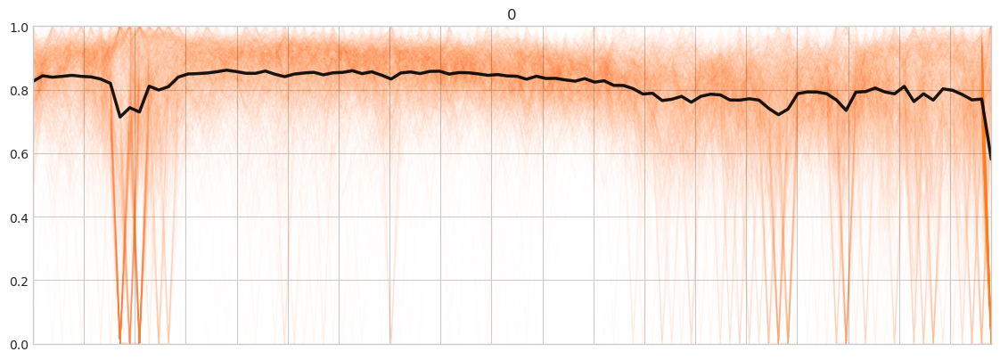

...

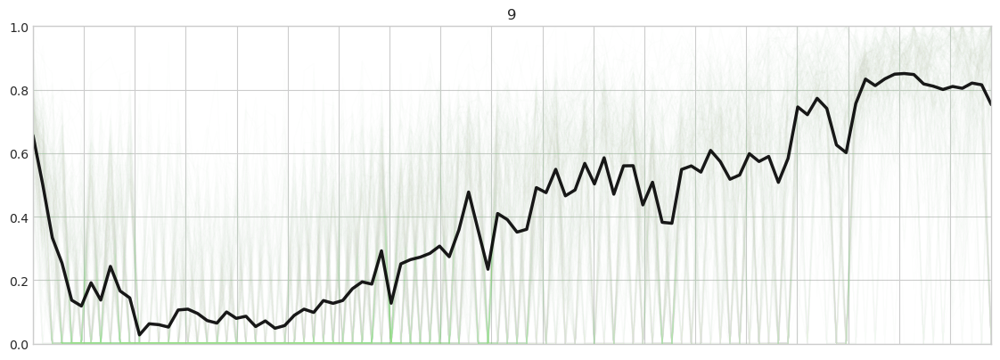

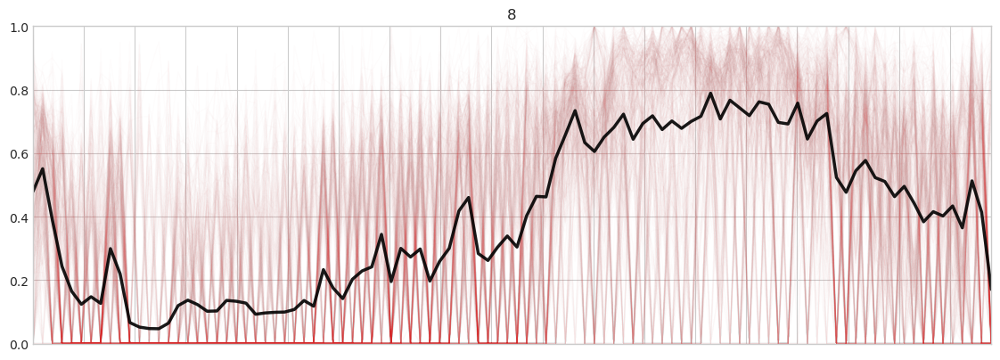

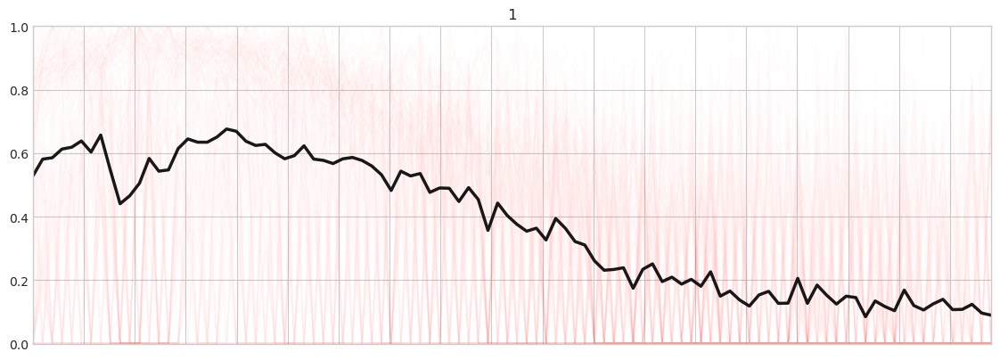

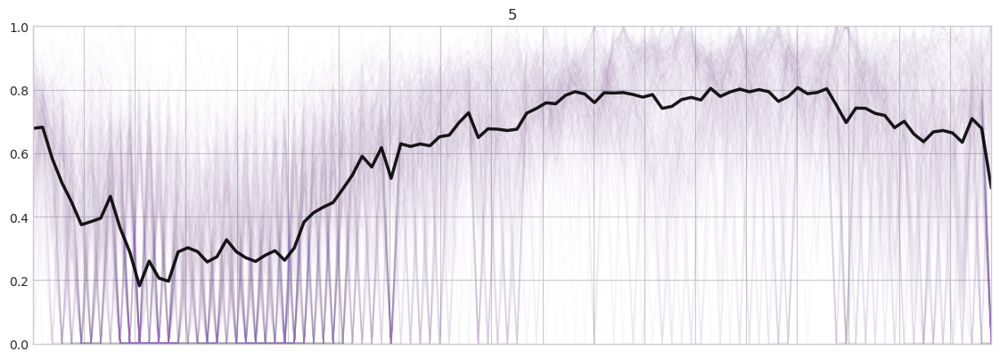

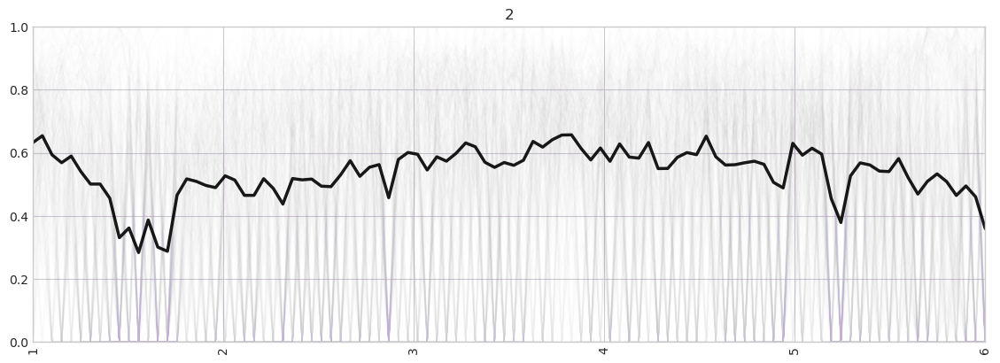

In [20]:
plt.show()

/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


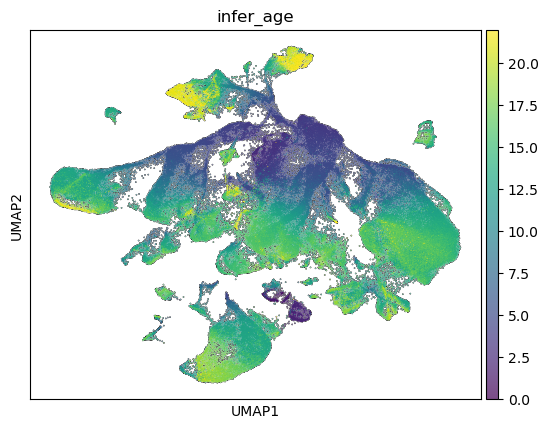

In [6]:
sc.pl.umap(sc_data, color=['infer_age'], legend_fontoutline=0.5, add_outline=True, legend_loc='on data', size=2, legend_fontsize=5)

In [19]:
# iamge formatting set
import seaborn as sns
import matplotlib as mp

cmap = sns.color_palette("ch:start=.2,rot=-.3", n_colors=1_000)
sns.set_context(context='paper')
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'lightgrey'})

In [30]:
obs_df = sc_data.obs.copy()
obs_df

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,cell,pANN,library,RNA_snn_res.0.5,seurat_clusters,collected_time,infer_age,infer_age_int,tissue_old,sub_cluster_number,celltype,tissue_update,germ_layer,subtype
index,,,,,,,,,,,,,,,,,,
CELL344_N2_1_1,V2R2209070002,10099.0,2392,1.089217,CELL344_N2_1_1,0.249983031290301,V2R2209070002,13.0,13,E12-14h,12.634391,13.0,CNS,5,glia,CNS,neuroectoderm,chiasm glia
CELL345_N1_1_1,V2R2209070002,3928.0,1049,0.712831,CELL345_N1_1_1,0.249983031290301,V2R2209070002,4.0,4,E12-14h,12.707846,13.0,hemolymph,2,plasmatocytes,hemolymph,mesoderm,plasmatocytes
CELL346_N3_1_1,V2R2209070002,7762.0,2243,0.979129,CELL346_N3_1_1,0.249983031290301,V2R2209070002,24.0,24,E12-14h,14.176962,14.0,midgut,2,entero-endocrine cells,midgut,endoderm,entero-endocrine cells (Mip+)
CELL347_N2_1_1,V2R2209070002,21023.0,2147,0.756315,CELL347_N2_1_1,0.249983031290301,V2R2209070002,10.0,10,E12-14h,16.564274,17.0,epidermis,1,epidermal epithelium,epidermis,ectoderm,epidermal epithelium
CELL348_N1_1_1,V2R2209070002,2809.0,617,1.637593,CELL348_N1_1_1,0.249983031290301,V2R2209070002,4.0,4,E12-14h,12.707846,13.0,hemolymph,2,plasmatocytes,hemolymph,mesoderm,plasmatocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CELL8956_N1_6,V2R2206210025,1203.0,667,9.226933,CELL8956_N1_6,0.00861680821003276,V2R2206210025,0.0,0,E8-10h,11.018364,11.0,CNS,1,mature neurons,CNS,neuroectoderm,mature neurons
CELL8959_N1_6,V2R2206210025,1530.0,593,6.339869,CELL8959_N1_6,0.00861680821003276,V2R2206210025,3.0,3,E8-10h,6.904841,7.0,CNS,9,ganglion mother cells,CNS,neuroectoderm,ganglion mother cells
CELL8963_N1_6,V2R2206210025,4073.0,1373,9.059661,CELL8963_N1_6,0.00861680821003276,V2R2206210025,6.0,6,E8-10h,6.721202,7.0,ectoderm,2,ectoderm primordium,ectoderm,ectoderm,ectoderm primordium


In [21]:
import numpy as np
seurat_clusters = np.unique(sc_data.obs['celltype'])
seurat_clusters

array(['AMP/EE progenitors', 'CNS primordium', 'Malpighian tubule',
       'Malpighian tubule anlage', 'Malpighian tubule primordium',
       'adult foregut precursors', 'adult hindgut precursors',
       'adult midgut progenitors', 'amnioserosa',
       'amnioserosa primordium', 'anal pad', 'apoptotic amnioserosa',
       'atrium', 'cardiogenic mesoderm', 'cellular blastoderm',
       'chordotonal organ', 'copper cells', 'corpora cardiaca',
       'corpus allata', 'crystal cells', 'developing fat body',
       'developing foregut', 'dorsal ectoderm', 'dorsal median cells',
       'dorsal trunk', 'dorsal vessel', 'dorsal vessel primordium',
       'early-developing fat body', 'ectoderm primordium',
       'ectoderm/mesoderm primordium', 'endoderm',
       'endoderm/mesoderm primordium', 'entero-endocrine cells',
       'enterocytes', 'epidermal epithelium', 'epidermis primordium',
       'epidermoblast/sensory primordium', 'esophagus',
       'esophagus primordium', 'fat body primordiu

## 1. try trajectory MT_lineage

In [58]:
sc.pp.neighbors(sc_data, n_neighbors=10)
sc.tl.diffmap(sc_data)

computing neighbors
    using 'X_pca' with n_pcs = 30


/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:23)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:02)
    eigenvalues of transition matrix
    [1.         0.9991201  0.9990186  0.99896175 0.9987949  0.9987377
     0.998674   0.99838746 0.9980384  0.99765474 0.9974407  0.99735034
     0.9972614  0.99715346 0.9970724 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:06:16)


In [104]:
sc.tl.pca(sc_data, svd_solver='arpack')

computing PCA


    with n_comps=50
    finished (0:02:43)


In [105]:
# try trajectory MT_lineage
train = np.in1d(sc_data.obs['celltype'], ['Malpighian tubule anlage', 'Malpighian tubule primordium', 'Malpighian tubule'])
print(train)
try_data = sc_data[train]

[False False False ... False False False]


/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


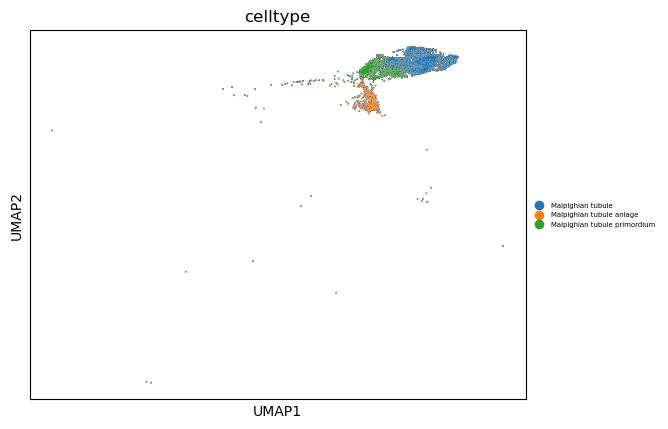

In [106]:
sc.pl.umap(try_data, color=['celltype'], legend_fontoutline=0.5, add_outline=True, legend_loc='right margin', size=2, legend_fontsize=5)

/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/ouyangkang/software/anaconda3/envs/scRNA/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


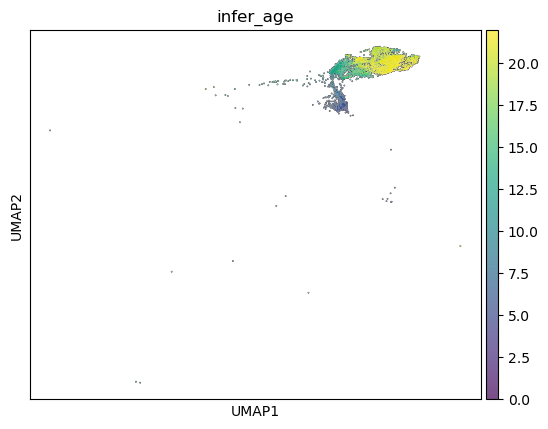

In [107]:
sc.pl.umap(try_data, color=['infer_age'], legend_fontoutline=0.5, add_outline=True, legend_loc='right margin', size=2, legend_fontsize=5)

In [108]:
sc.tl.leiden(try_data)

running Leiden clustering


    finished: found 59 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [109]:
sc.tl.paga(try_data)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:02)


In [113]:
sc.tl.paga(try_data, groups='leiden')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:03)


In [118]:
# modify its size for better show trajectory
try_data.uns['leiden_sizes'] = [1] * len(try_data.uns['leiden_sizes'])

--> added 'pos', the PAGA positions (adata.uns['paga'])


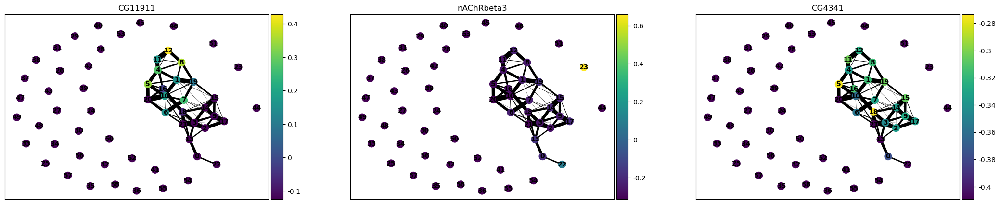

In [119]:
sc.pl.paga(try_data, colors=['CG11911', 'nAChRbeta3', 'CG4341'])

In [102]:
try_data.var_names

Index(['IA-2', 'CG11911', 'nAChRbeta3', 'CG4341', 'CG43349', 'CG5080', 'NLaz',
       'CG13946', 'CG13947', 'Npc2a',
       ...
       'CG11585', 'CG10597', 'CG12506', 'CG15155', 'CG32188', 'CG11854',
       'SNCF', 'CG42779', 'lncRNA:CR46076', 'CG42583'],
      dtype='object', name='index', length=999)